**binary class (not exact probabilities) classification for Coffee cherry beans into ripe vs unripe**

**Importing tensorflow/keras and other image/data processing libraries.**

In [ ]:
import numpy as np
import os
import PIL
import PIL.Image
from PIL import Image
import tensorflow as tf
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

**importing zip file containing training/validation datasets with coffee cherry image.**

In [ ]:
import io
from google.colab import files
uploaded = files.upload()


Saving coffee_model_data.zip to coffee_model_data.zip


**unzipping data**

In [ ]:
!unzip coffee_model_data.zip

Archive:  coffee_model_data.zip
   creating: coffee_model_data/
   creating: coffee_model_data/validate/
  inflating: coffee_model_data/.DS_Store  
  inflating: __MACOSX/coffee_model_data/._.DS_Store  
   creating: coffee_model_data/field_testing/
   creating: coffee_model_data/train/
  inflating: coffee_model_data/validate/.DS_Store  
  inflating: __MACOSX/coffee_model_data/validate/._.DS_Store  
   creating: coffee_model_data/validate/unripe/
   creating: coffee_model_data/validate/ripe/
  inflating: coffee_model_data/field_testing/.DS_Store  
  inflating: __MACOSX/coffee_model_data/field_testing/._.DS_Store  
  inflating: coffee_model_data/field_testing/ripe_field5.jpg  
  inflating: __MACOSX/coffee_model_data/field_testing/._ripe_field5.jpg  
  inflating: coffee_model_data/field_testing/mixed_field1.jpg  
  inflating: __MACOSX/coffee_model_data/field_testing/._mixed_field1.jpg  
  inflating: coffee_model_data/field_testing/ripe_field4.jpg  
  inflating: __MACOSX/coffee_model_data/f

**Verifying if data was appropriately downloaded**

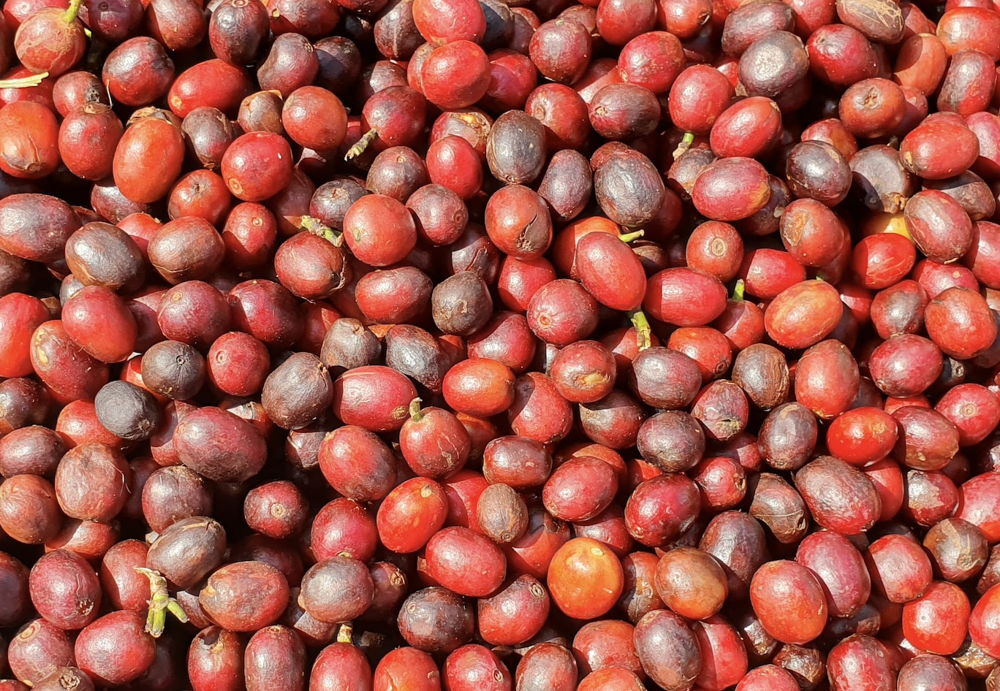

In [ ]:
PIL.Image.open("coffee_model_data/validate/ripe/ripe200.jpg")

**Importing required libraries for image classification/deep-learning**

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
from keras.callbacks import EarlyStopping

# dimensions of our images.
img_width, img_height = 500, 500

train_data_dir = 'coffee_model_data/train'
validation_data_dir = 'coffee_model_data/validate'
nb_train_samples = 180
nb_validation_samples = 20
epochs = 5
batch_size = 60

In [ ]:
if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

**Configuring model layers, notice I have used 'sigmoid' activation function in last layer as this is a binary classification problem. If I wish to get probabilities, I can use 'softmax' activation for dense layer with 2 output neurons (1 for each class)**

In [ ]:
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))

**Compiling model, defining loss function, optimiser and evaluation metrics. Also, writing data generator function which will augment training data in batches as per given configuration.**

In [ ]:
#rmsprop = keras.optimizers.RMSprop(lr=0.0001,centered = True,momentum=0.1) #https://keras.io/api/optimizers/rmsprop/
#https://stats.stackexchange.com/questions/351409/difference-between-rho-and-decay-arguments-in-keras-rmsprop
model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rotation_range=45,
    rescale=1. / 255,
    shear_range=0.15,
    width_shift_range=0.15,
		height_shift_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.8,1.2],
    fill_mode="nearest")

In [ ]:
# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255)

In [ ]:
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='binary')

Found 360 images belonging to 2 classes.


In [ ]:
validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='binary')


Found 40 images belonging to 2 classes.


**Training the model with patience criteria on loss. If loss doesn't improve for 3 subsequent runs then model training should be paused.**

In [ ]:
es = EarlyStopping(monitor='loss', patience=3)
model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size,
    callbacks=[es])

Epoch 1/5
3/3 [==============================] - 43s 14s/step - loss: 4.7187 - accuracy: 0.5833
Epoch 2/5
3/3 [==============================] - 42s 14s/step - loss: 4.6219 - accuracy: 0.6778
Epoch 3/5
3/3 [==============================] - 42s 14s/step - loss: 0.1716 - accuracy: 0.9722
Epoch 4/5
3/3 [==============================] - 42s 14s/step - loss: 0.1042 - accuracy: 0.9944
Epoch 5/5
3/3 [==============================] - 42s 14s/step - loss: 0.0630 - accuracy: 0.9944


#**testing model on unseen data**

1/1 [==============================] - 0s 2ms/step
This image has 100.00 percent ripe coffee cherries and 0.00 percent unripe coffee cherries.
This image contains majorly ripe cherries


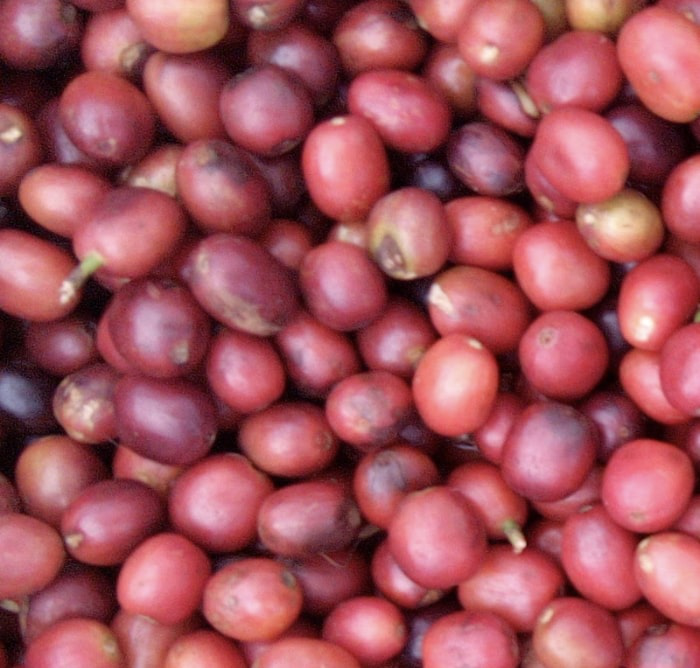

In [ ]:
img = keras.preprocessing.image.load_img(
    "coffee_model_data/field_testing/ripe_field1.jpg", target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array, verbose=1)
score = predictions[0]
print(
    "This image has %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries."
    % (100 * (1 - score), 100 * score)
)

if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")


PIL.Image.open("coffee_model_data/field_testing/ripe_field1.jpg")

1/1 [==============================] - 0s 1ms/step
This image has 100.00 percent ripe coffee cherries and 0.00 percent unripe coffee cherries.
This image contains majorly ripe cherries


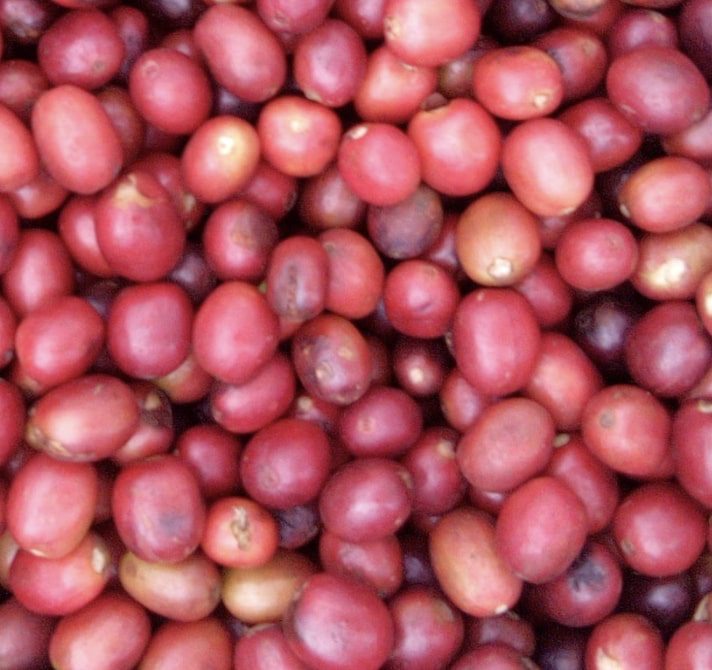

In [ ]:
img = keras.preprocessing.image.load_img(
    "coffee_model_data/field_testing/ripe_field2.jpg", target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array, verbose=1)
score = predictions[0]
print(
    "This image has %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries."
    % (100 * (1 - score), 100 * score)
)

if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")


PIL.Image.open("coffee_model_data/field_testing/ripe_field2.jpg")

1/1 [==============================] - 0s 2ms/step
This image has 100.00 percent ripe coffee cherries and 0.00 percent unripe coffee cherries.
This image contains majorly ripe cherries


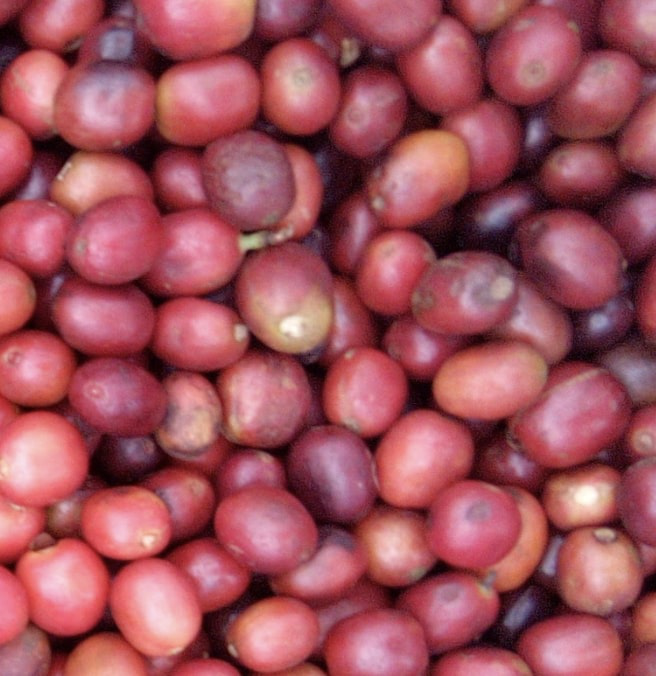

In [ ]:
img = keras.preprocessing.image.load_img(
    "coffee_model_data/field_testing/ripe_field3.jpg", target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array, verbose=1)
score = predictions[0]
print(
    "This image has %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries."
    % (100 * (1 - score), 100 * score)
)

if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")


PIL.Image.open("coffee_model_data/field_testing/ripe_field3.jpg")

**Gathering some more fresh/unseen samples of ripe cherry testing data**

In [ ]:
import io
from google.colab import files
uploaded = files.upload()


Saving field_testing.zip to field_testing.zip


In [ ]:
!unzip field_testing.zip

Archive:  field_testing.zip
   creating: field_testing/
  inflating: field_testing/.DS_Store  
  inflating: __MACOSX/field_testing/._.DS_Store  
  inflating: field_testing/ripe_field_testing1.jpg  
  inflating: __MACOSX/field_testing/._ripe_field_testing1.jpg  
  inflating: field_testing/ripe_field_testing3.jpg  
  inflating: __MACOSX/field_testing/._ripe_field_testing3.jpg  
  inflating: field_testing/ripe_field_testing2.jpg  
  inflating: __MACOSX/field_testing/._ripe_field_testing2.jpg  


1/1 [==============================] - 0s 1ms/step
This image has 100.00 percent ripe coffee cherries and 0.00 percent unripe coffee cherries.
This image contains majorly ripe cherries


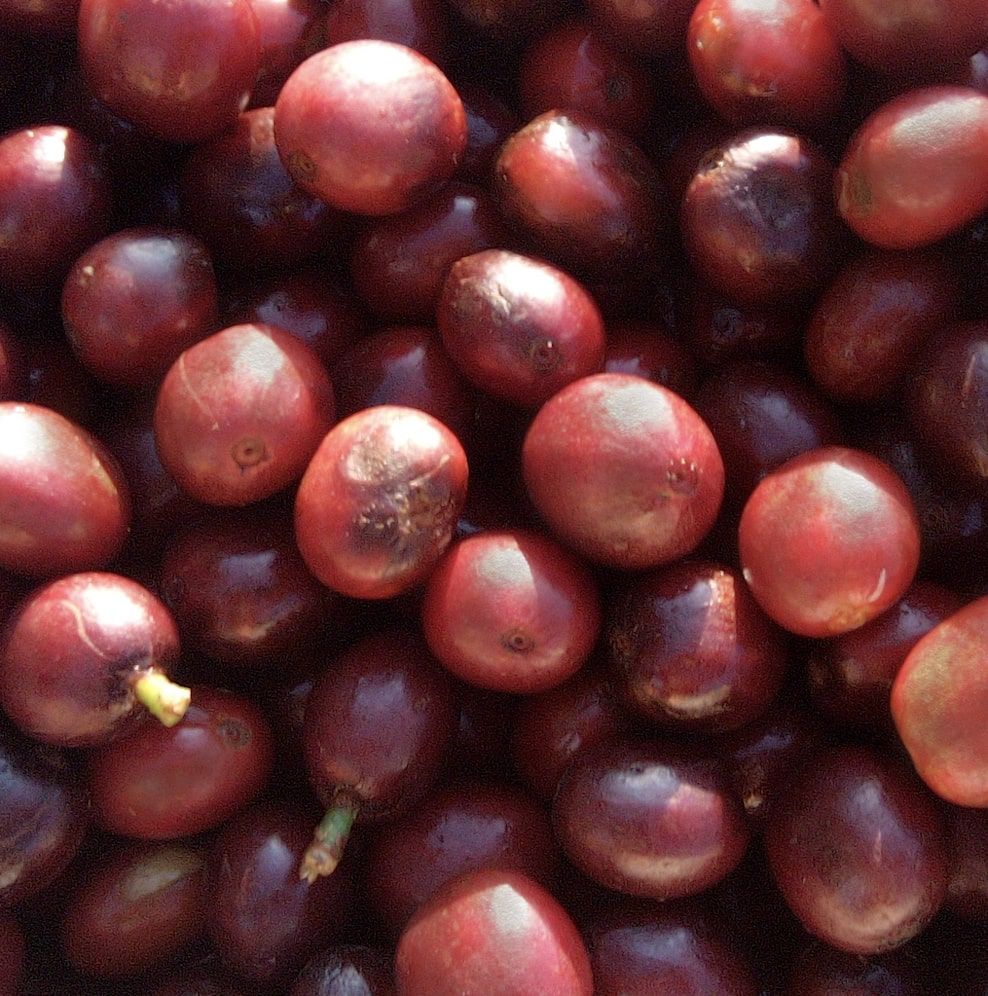

In [ ]:
img = keras.preprocessing.image.load_img(
    "field_testing/ripe_field_testing1.jpg", target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array, verbose=1)
score = predictions[0]
print(
    "This image has %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries."
    % (100 * (1 - score), 100 * score)
)

if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")

PIL.Image.open("field_testing/ripe_field_testing1.jpg")

1/1 [==============================] - 0s 1ms/step
This image has 100.00 percent ripe coffee cherries and 0.00 percent unripe coffee cherries.
This image contains majorly ripe cherries


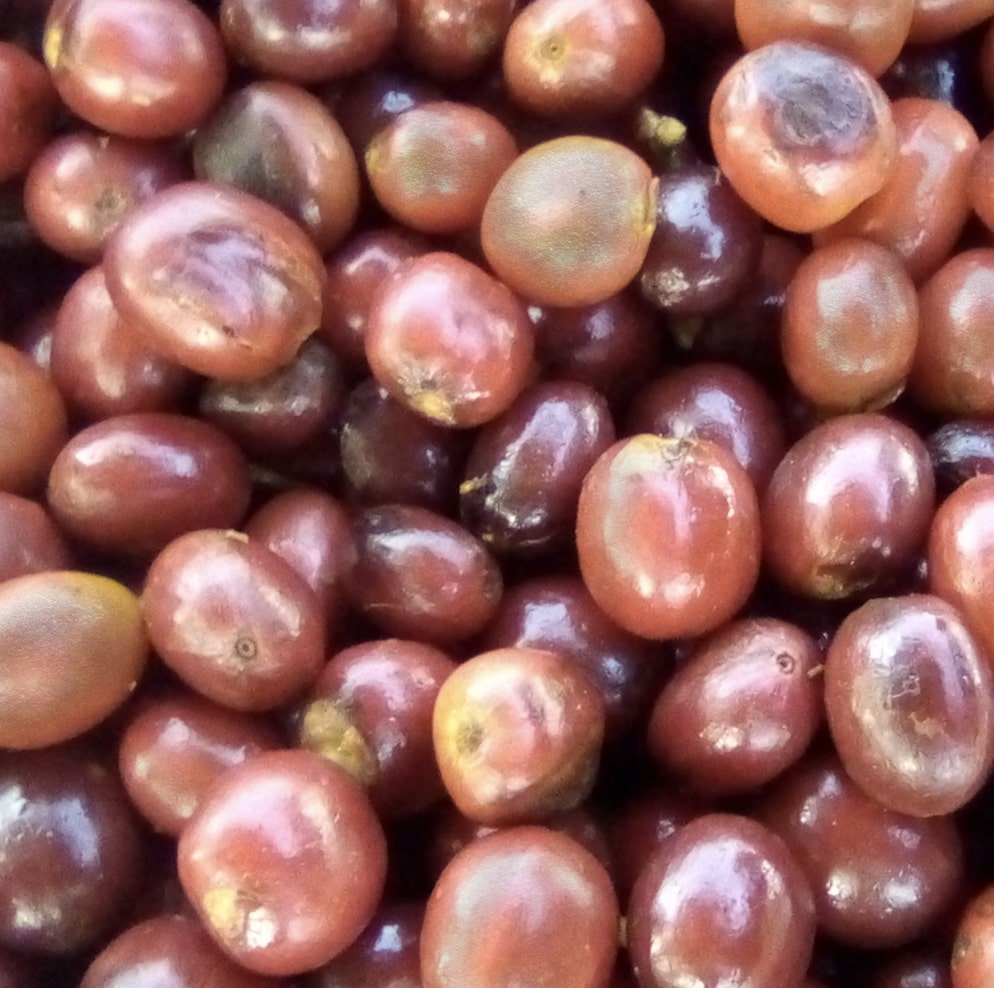

In [ ]:
img = keras.preprocessing.image.load_img(
    "field_testing/ripe_field_testing2.jpg", target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array, verbose=1)
score = predictions[0]
print(
    "This image has %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries."
    % (100 * (1 - score), 100 * score)
)

if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")

PIL.Image.open("field_testing/ripe_field_testing2.jpg")

1/1 [==============================] - 0s 1ms/step
This image has 100.00 percent ripe coffee cherries and 0.00 percent unripe coffee cherries.
This image contains majorly ripe cherries


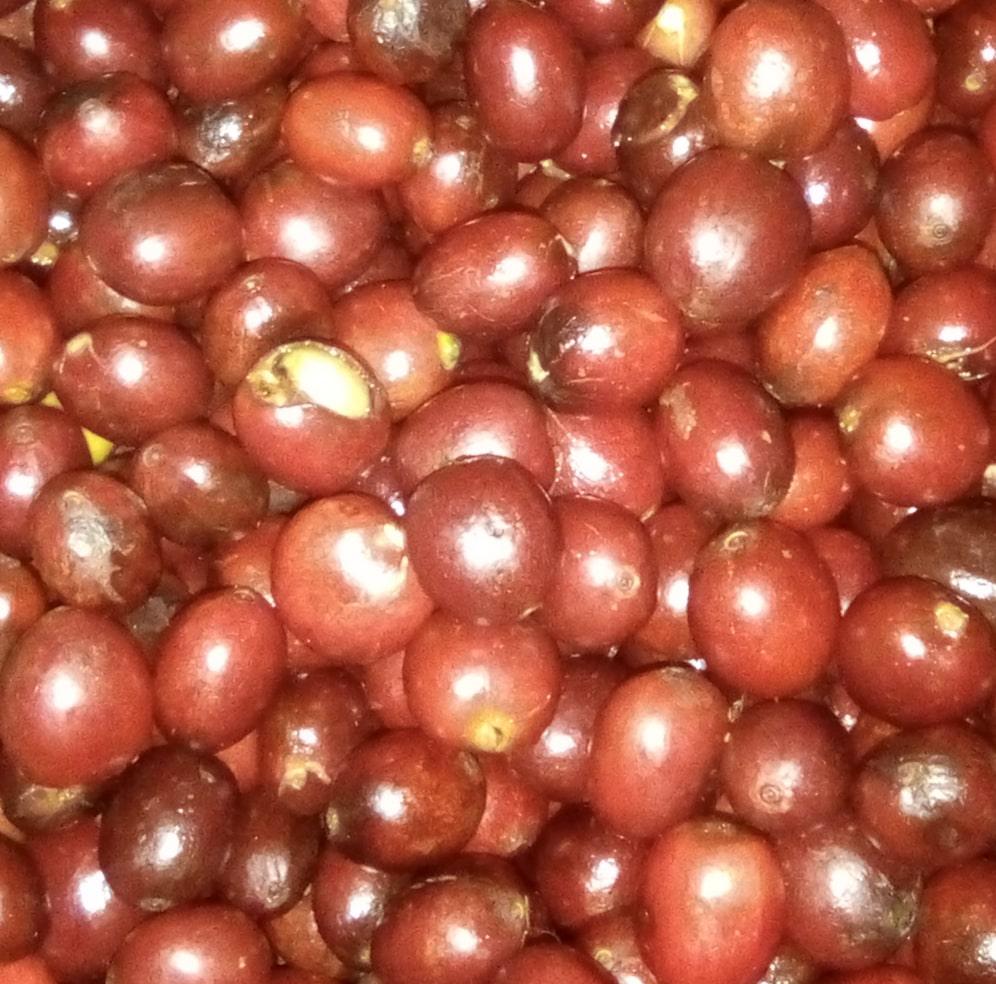

In [ ]:
img = keras.preprocessing.image.load_img(
    "field_testing/ripe_field_testing3.jpg", target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array, verbose=1)
score = predictions[0]
print(
    "This image has %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries."
    % (100 * (1 - score), 100 * score)
)

if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")

PIL.Image.open("field_testing/ripe_field_testing3.jpg")

score: [1.]
predictions: [[1.]]
This image is 0.00 percent ripe coffee cherries and 100.00 percent unripe coffee cherries
This image contains majorly unripe cherries


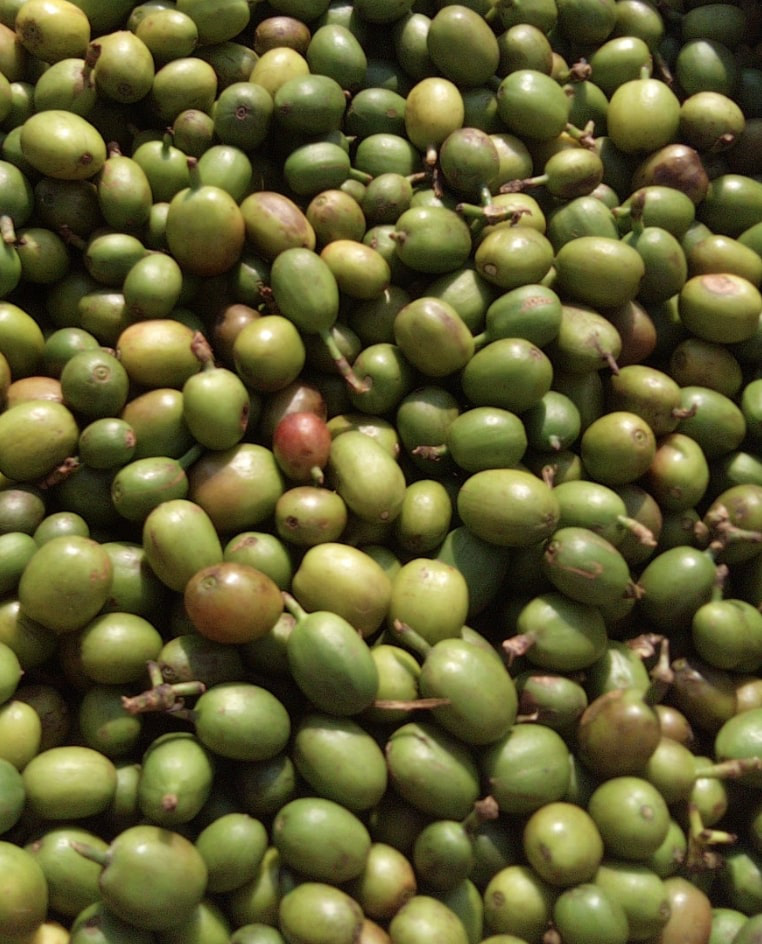

In [ ]:
x = "coffee_model_data/field_testing/unripe_field1.jpg"
img = keras.preprocessing.image.load_img(x, target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array)
score = predictions[0]
print("score:",score)
print("predictions:",predictions)

print(
    "This image is %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries"
    % (100 * (1 - score), 100 * score)
)


if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")

PIL.Image.open(x)

score: [1.]
predictions: [[1.]]
This image contains majorly unripe cherries
This image is 0.00 percent ripe coffee cherries and 100.00 percent unripe coffee cherries


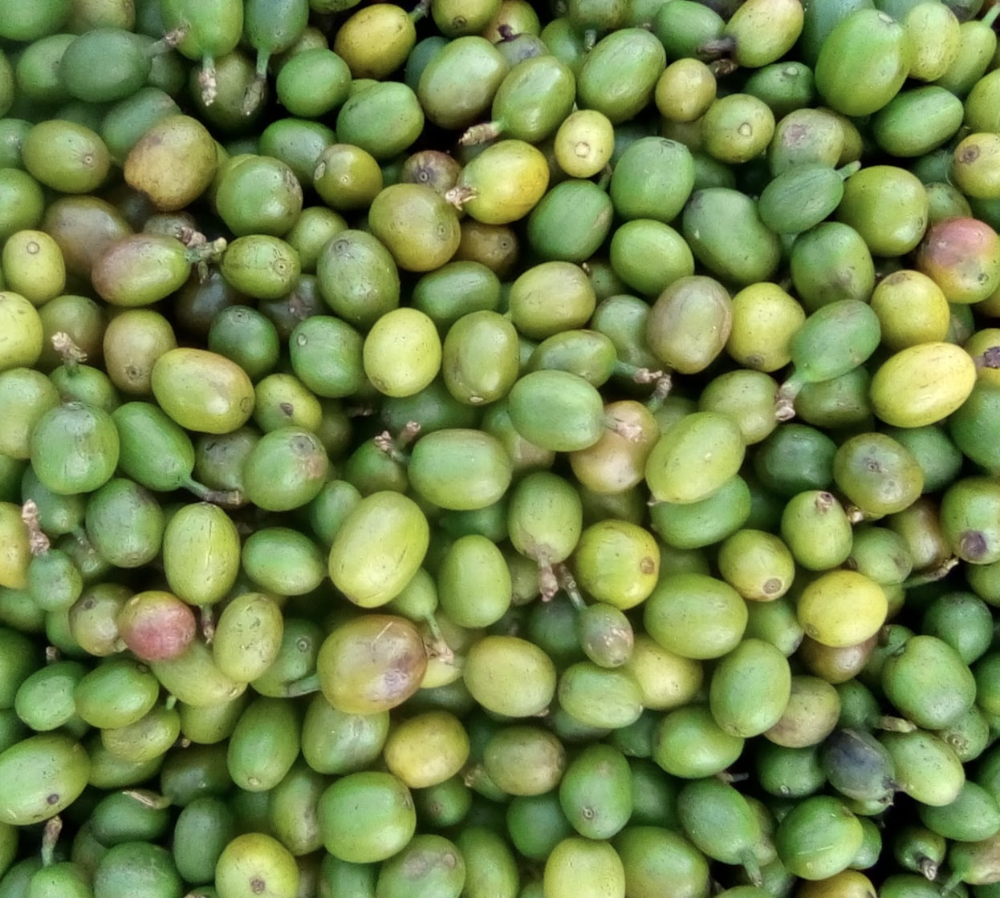

In [ ]:
x = "coffee_model_data/field_testing/unripe_field2.jpg"
img = keras.preprocessing.image.load_img(x, target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array)
score = predictions[0]
print("score:",score)
print("predictions:",predictions)

if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")

print(
    "This image is %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries"
    % (100 * (1 - score), 100 * score)
)
PIL.Image.open(x)

score: [1.]
predictions: [[1.]]
This image contains majorly unripe cherries
This image is 0.00 percent ripe coffee cherries and 100.00 percent unripe coffee cherries


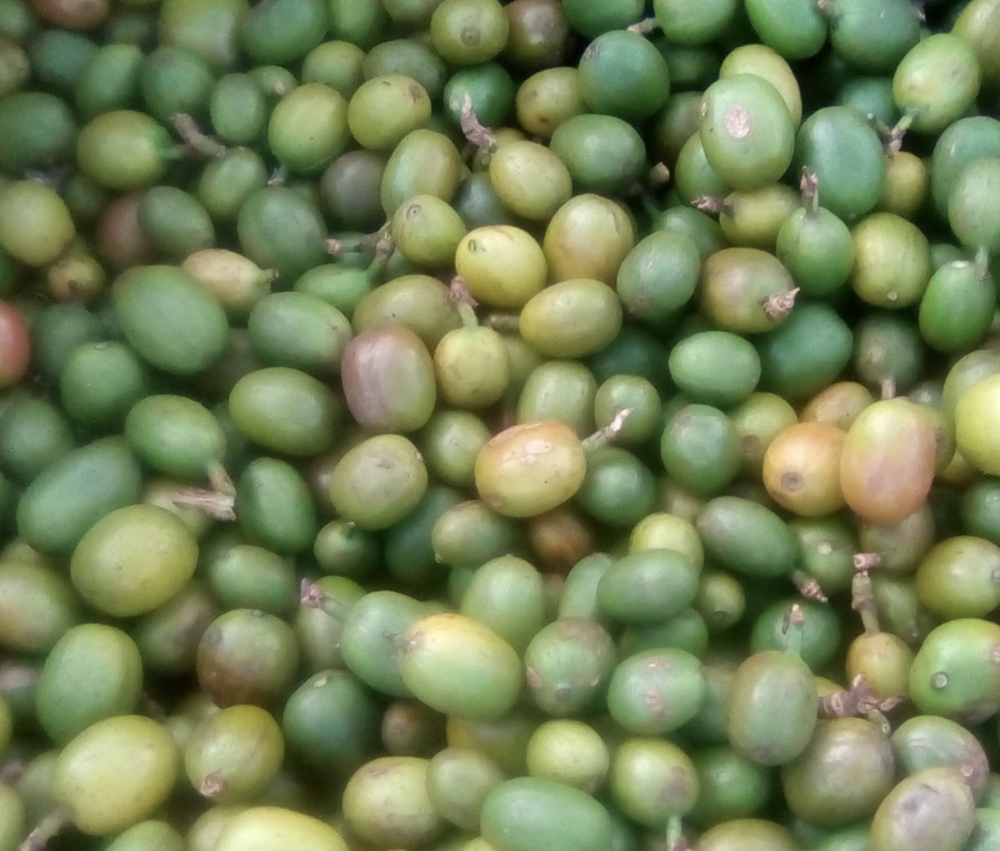

In [ ]:
x = "coffee_model_data/field_testing/unripe_field3.jpg"
img = keras.preprocessing.image.load_img(x, target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array)
score = predictions[0]
print("score:",score)
print("predictions:",predictions)

if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")

print(
    "This image is %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries"
    % (100 * (1 - score), 100 * score)
)
PIL.Image.open(x)

score: [1.]
predictions: [[1.]]
This image contains majorly unripe cherries
This image is 0.00 percent ripe coffee cherries and 100.00 percent unripe coffee cherries


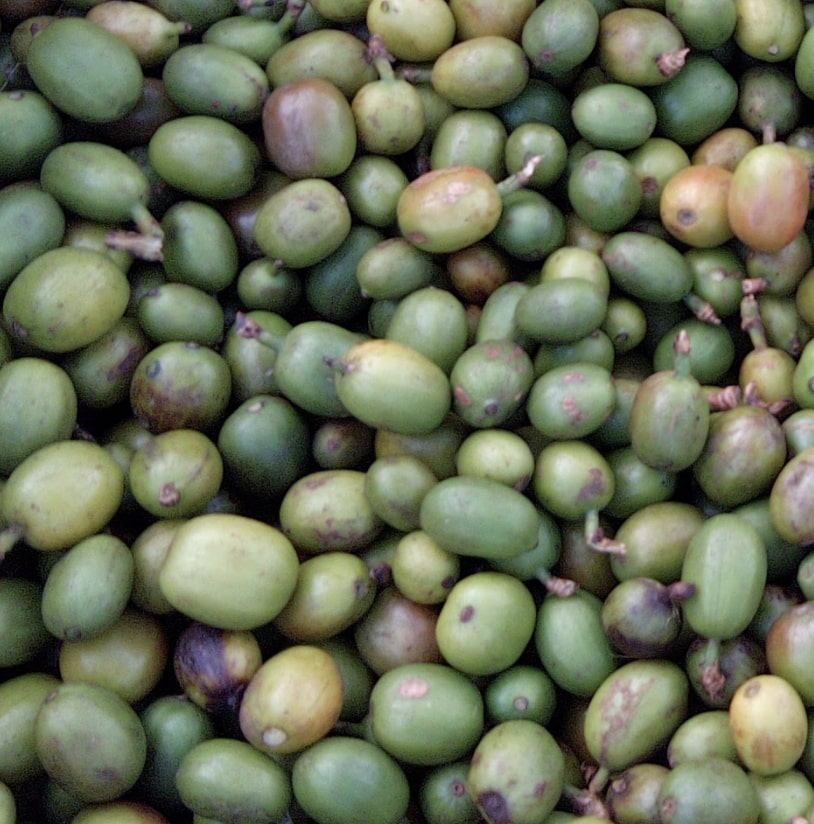

In [ ]:
x = "coffee_model_data/field_testing/unripe_field4.jpg"
img = keras.preprocessing.image.load_img(x, target_size=(img_width, img_height)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create batch axis

predictions = model.predict(img_array)
score = predictions[0]
print("score:",score)
print("predictions:",predictions)

if(score>0.5):
  print("This image contains majorly unripe cherries")
else:
  print("This image contains majorly ripe cherries")

print(
    "This image is %.2f percent ripe coffee cherries and %.2f percent unripe coffee cherries"
    % (100 * (1 - score), 100 * score)
)
PIL.Image.open(x)